# Simulating a sinusoidal trajectory of points 


In [5]:
# Simulation parameters and function
import numpy as np

def x_star(t):
    return (-7.8*np.sin(0.12*t)
            + 1.6*np.sin(0.28*t)
            + 9.4*np.sin(0.37*t)
            - 10.6*np.sin(0.64*t))

# Time vector (adjust T and fs as needed)
T = 200.0  # total time in seconds
fs = 50.0  # sampling frequency in Hz
t = np.arange(0, T, 1.0/fs)
x = x_star(t)

# quick summary
print(f"Generated {len(t)} samples from t=0..{T} s (fs={fs} Hz)")
x[:10]

Generated 10000 samples from t=0..200.0 s (fs=50.0 Hz)


array([ 0.        , -0.07587696, -0.15173567, -0.22755789, -0.30332539,
       -0.37901993, -0.45462331, -0.53011733, -0.60548381, -0.68070461])

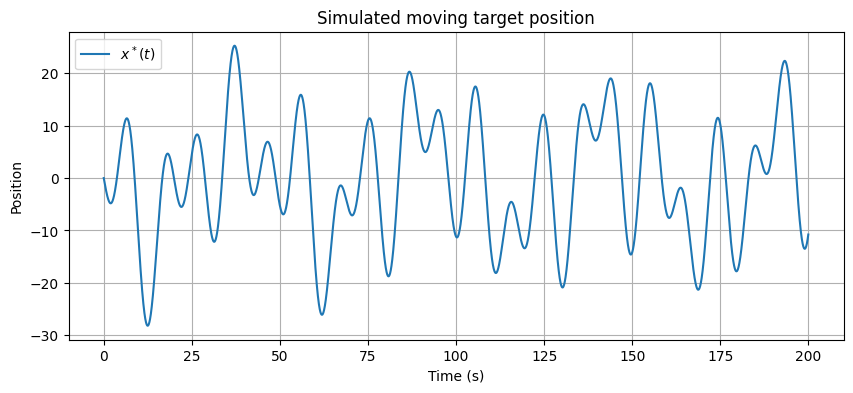

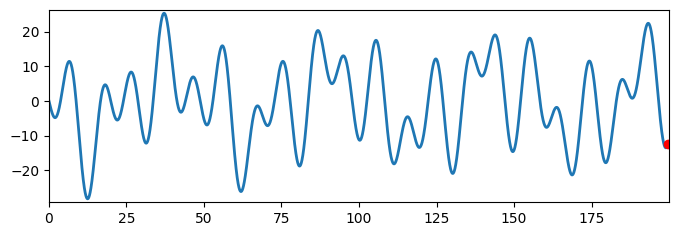

In [6]:
# Plot the trajectory
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(10,4))
plt.plot(t, x, label=r"$x^*(t)$")
plt.xlabel("Time (s)")
plt.ylabel("Position")
plt.title("Simulated moving target position")
plt.grid(True)
plt.legend()
plt.show()

# Robust animation — ensure sequences are passed to set_data to avoid "x must be a sequence"
from matplotlib import animation
from IPython.display import HTML, display

fig, ax = plt.subplots(figsize=(8,2.5))
ax.set_xlim(float(t[0]), float(t[-1]))
ax.set_ylim(float(x.min() - 1.0), float(x.max() + 1.0))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], 'ro')

def init():
    line.set_data([], [])
    point.set_data([], [])
    return line, point

def animate(idx):
    i = int(idx)
    i = max(0, min(i, len(t)-1))
    # pass sequences: slices for the line, 1-element lists for the point
    line.set_data(t[:i+1], x[:i+1])
    point.set_data([t[i]], [x[i]])
    return line, point

# cap frames for performance
step = max(1, int(len(t)/500))  # target ~500 frames
frames = list(range(0, len(t), step))
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frames, interval=1000.0/fs*step, blit=True)

# Try to display JS animation; if that fails, fall back to the animation object
try:
    display(HTML(anim.to_jshtml()))
except Exception as e:
    print("JS animation failed:", e)
    display(anim)


In [7]:
# Create a simple Target object that moves according to x_star(t)
class Target:
    def __init__(self, x_func):
        self.x_func = x_func

    def state(self, time):
        """Return the target state at time `time` as a dict with keys 't' and 'x'"""
        return {'t': float(time), 'x': float(self.x_func(time))}

# Example: sample the first 20 seconds and show the first 8 samples
target = Target(x_star)
sample_t = np.arange(0, 20.0, 1.0/fs)
samples = [target.state(tt) for tt in sample_t]

samples[:8]

# Optional: save samples to CSV
# import csv
# with open('target_samples.csv', 'w', newline='') as f:
#     writer = csv.DictWriter(f, fieldnames=['t', 'x'])
#     writer.writeheader()
#     writer.writerows(samples)


[{'t': 0.0, 'x': 0.0},
 {'t': 0.02, 'x': -0.07587695877067785},
 {'t': 0.04, 'x': -0.1517356708504798},
 {'t': 0.06, 'x': -0.22755789297369003},
 {'t': 0.08, 'x': -0.3033253887243277},
 {'t': 0.1, 'x': -0.3790199319595522},
 {'t': 0.12, 'x': -0.45462331023131364},
 {'t': 0.14, 'x': -0.5301173282056644}]